<a href="https://colab.research.google.com/github/schettinoezequiel7-design/ProcesamientoDelHabla/blob/main/Schettino_Ezequiel_PH_TP1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TP1 PROCESAMIENTO DEL HABLA: webscrapping

**Schettino, Ezequiel Martín**


* Resolver las consignas comentando el código fuente, indicando desde dónde fue extraido o generado.

* Explicar y justificar cada paso realizado usando los bloques de texto.

* Publique enlace público a su notebook en google colab y también enlace a su repositorio github de la materia.


## EJERCICIO CONSIGNA

* Cree una nube de palabras de un texto en español.

* Dicho texto puede ser descargado de Internet (webscrapping) o extraído del dataset de alguna librería.

* Puede usar cualquier libreria o herramienta para obtener el texto de su interés.

* En este notebook explica el paso a paso del proceso.



## 1- Webscrapping

Extrae un texto de Internet de una sóla página web usando alguna de las técnicas de webscrapping vistas en clase. Busca el discurso de alguna persona quien te inspire o haya dado una charla motivadora.

No puedes repetir ni usar ni el mismo texto ni la misma web que otra persona quien ya entregó en el foro.

Abajo añade los bloques de código y texto necesarios. Explica paso a paso como descargaste el texto de tu interés.


Realizaré scrapping del siguiente website:

* https://innovationforsocialchange.org/tienes-que-encontrar-eso-que-amas-discurso-de-steve-jobs/

Discurso de Steve Jobs realizado en la Universidad de Standord, el 12 de junio de 2005.

# Para el trabajo opté por una web estática para bajar el riesgo de modificaciones o errores en los códigos.

Realicé también ciertas averiguaciones para mejorar mi entendimiento de las mismas con Gemini.

**Respuesta** Es una web estática porque el HTML está completo desde el servidor: Cuando haces la petición con requests, el servidor devuelve todo el contenido del artículo (título, párrafos y estructura) ya escrito y renderizado en el código fuente HTML.

Sin carga dinámica compleja: No depende de tecnologías de JavaScript del lado del cliente (como React o Angular) que oculten el texto o requieran simular un navegador (con Selenium) para poder leerlo.

Aunque por detrás utilice un CMS como WordPress, para tu código de Python el texto está "fijo" y disponible de inmediato en la primera respuesta del servidor.

**Mi ayuda para la realización de este trabajo son los códigos vistos en clase junto con el apoyo del chat de Geminis disponible en gmail.**

**Prompt**

Que hace cada parte de este código?

! pip install requests beautifulsoup4 html5lib

**Respuesta**

La orden que mencionaste instala las tres herramientas fundamentales que vas a usar:


* requests: Para descargar el código HTML fuente de la página web de forma limpia y rápida.

+ beautifulsoup4: Para analizar la estructura de ese HTML y extraer con precisión los párrafos del discurso.

* html5lib: El analizador avanzado que le da robustez a BeautifulSoup para interpretar correctamente el código de la página.

In [1]:
! pip install requests beautifulsoup4 html5lib


Una vez que lo instalo en mi entorno, lo importo para utilizarlo.

In [2]:
import requests
from bs4 import BeautifulSoup

In [4]:
# URL de la web que contiene el discurso.
url = "https://innovationforsocialchange.org/tienes-que-encontrar-eso-que-amas-discurso-de-steve-jobs/"

# Realizar la solicitud HTTP
respuesta = requests.get(url) # Guarda el enlace: Almacena la URL exacta de la web donde está el discurso de Steve Jobs en la variable url.
respuesta.raise_for_status()  # Comprueba que el servidor haya respondido de forma correcta (con un código de estado HTTP 200 OK).
# Si la página no existiera o hubiera un error en el servidor, este comando interrumpiría la ejecución lanzando una alerta inmediata,
# asegurándote que tienes luz verde para avanzar.

**Prompt** La última línea, "respuesta.raise_for_status()" comprueba que la web no me tire un error (por ejemplo, me avisaría si me tira uno de esos clásicos errores 404 o alguno de esos)?

**Respuesta** Sí.
Su función es verificar el código de estado HTTP que devolvió el servidor tras realizar la petición:Si hay un error (como un clásico 404 Not Found, un 403 Forbidden o un 500 Internal Server Error): Lanzará una excepción (un error de tipo HTTPError) que detendrá la ejecución del programa de inmediato, advirtiéndote que algo falló.   
Si la respuesta es exitosa (código 200 OK): No hace nada y el código continúa ejecutándose de manera normal con luz verde para avanzar.   

**Prompt**

Que hace el siguiente código?

sopa = BeautifulSoup(respuesta.text, 'html.parser')

**Respuesta**

* respuesta.text: Extrae el código fuente HTML que descargaste con requests y lo convierte en una gran cadena de texto.

* 'html.parser': Es el motor nativo de Python encargado de leer e interpretar las etiquetas HTML.

* BeautifulSoup(...): Toma todo ese texto HTML y lo transforma en un objeto estructurado y navegable (al que bautizaste como sopa).

# Gracias a esto, Python deja de ver la página como un simple texto lineal y sin forma y pasa a entender su estructura de árbol. Esto me permitirá buscar y extraer de forma muy sencilla únicamente los párrafos que componen el discurso de Steve Jobs, ignorando menús, barras laterales y publicidad.

In [5]:
sopa = BeautifulSoup(respuesta.text, 'html.parser')

In [6]:
# Buscamos el contenedor principal del artículo donde se aloja el discurso
contenedor_articulo = sopa.find('div', class_='entry-content')

if contenedor_articulo:
    # Extraemos todos los párrafos (<p>) que están dentro de ese contenedor
    parrafos = contenedor_articulo.find_all('p')

    # Unimos los textos de cada párrafo en una sola variable de texto plano
    texto_discurso = "\n\n".join([p.get_text(strip=True) for p in parrafos if p.get_text(strip=True)])

    print("¡Discurso extraído con éxito!\n")
    print(texto_discurso[:500] + "...\n[Texto listo para el preprocesamiento]")
else:
    print("No se encontró el contenedor principal, revisa la clase HTML.")

No se encontró el contenedor principal, revisa la clase HTML.


**Respuesta**

Respecto de la salida del código anterior.

Eso significa que la etiqueta principal o la clase del blog que usaba entry-content no coincide exactamente con la que utiliza este sitio web en particular. Es algo súper normal en web scraping; cada plantilla de WordPress o diseño web usa nombres de clases diferentes.

# Vamos a la website y observamos que el contenedor no es "entry-content" como me devolvió directamente Gemini, sino "fl-post-content clearfix".

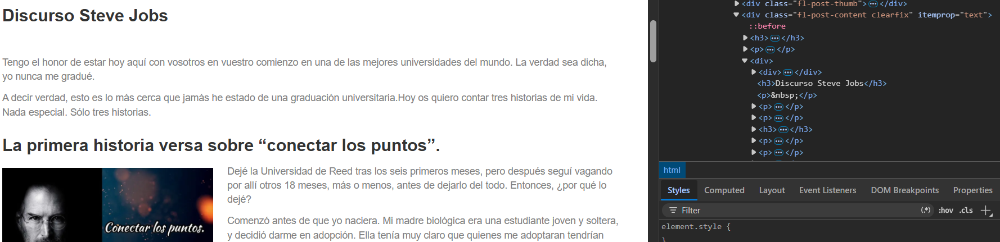

**Respuesta** Para solucionarlo de manera infalible y asegurar que extraigas el discurso sin depender de una clase específica, podemos buscar directamente todos los párrafos (< p >) que conforman el cuerpo principal de la página, o bien buscar el contenedor por la etiqueta general de artículos (article) probamos el siguiente código.

En la imágen, vemos como nos posicionamos utilizando la Herramienta de programador. Activamos el puntero y nos posicionamos en la primer oración del discurso y vemos el formato HTML < p >. Este es el que busca y scrapea.

In [8]:
# Buscamos todos los párrafos de la página
parrafos = sopa.find_all('p')

# Unimos el texto de todos los párrafos encontrados
texto_discurso = "\n\n".join([p.get_text(strip=True) for p in parrafos if p.get_text(strip=True)])
# La variable 'parrafos' la utilizamos dentro de la variable 'texto_discurso' para con el método join unir todos los grupos que empiezan con p.
# Esto van a ser los párrafos que nos interesan. Los guarda si tiene texto (strip=True) así elimina los vacíos de la web.
# 'n\n\' para realizar los saltos de párrafos para mantener la estructura.

print("¡DISCURSO EXTRAÍDO CON ÉXITO!\n")
print(texto_discurso[:100] + "...\n[TEXTO LISTO PARA EL PREPROCESAMIENTO]")
# Con el slice mostramos los primeros 100 caracteres por ahora.

¡DISCURSO EXTRAÍDO CON ÉXITO!

No sé cuántas veces habré visto este vídeo; el discurso de Steve Jobs es tan inspirador que  vale la...
[TEXTO LISTO PARA EL PREPROCESAMIENTO]


# En la imágen de abajo, vemos que se recortó todo  el texto entre las < p >.
# Esto incluye material que no pertenece al discurso. Pero el scraping está en proceso.

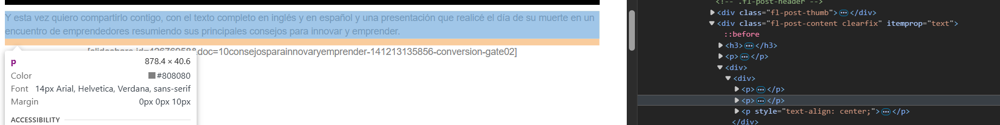

Al obtener una salida sucia, es decir, hay partes de la web que no pertenecen puramente al discurso (como por ejemplo "No sé cuántas veces habré..."), verificamos con la IA para tener mayor contexto y comprensión.

**Respuesta**

Si mirás con atención la salida de la imagen, vas a notar un detalle clave: el código trajo absolutamente todo lo que estaba dentro de los párrafos < p > de esa página, lo que incluye la introducción que escribió el autor del blog ("No sé cuántas veces habré visto este vídeo...") y un enlace de SlideShare, justo antes de que arranque el discurso propiamente dicho ("Tengo el honor de estar hoy aquí con vosotros...").

Para el preprocesamiento, limpieza de stop words, matriz documento-vocabulario y la nube de palabras, lo ideal es que la variable texto_discurso contenga únicamente las palabras del discurso.

# Ahora realizamos un recorte con "inicio_discurso" para que la variable "texto_discurso" comience exactamente ahí, con las oración inicial del discurso.

# La variable "texto_discurso" ya tiene el discurso completo.

In [9]:
inicio_discurso = texto_discurso.find("Tengo el honor de estar hoy aquí con vosotros") # Pone la primer frase del discurso y la encuentra en el cuerpo de la web.

if inicio_discurso != -1: # Condición para verificar que se encontró la frase correspondiente, por consiguiente, el inicio del discurso.
    texto_discurso = texto_discurso[inicio_discurso:]
    print("AHORA SÍ EL TEXTO COMIENZA EXACTAMENTE EN EL DISCURSO.\n")
else:
    print("No se encontró la frase de inicio, revisa el texto.")

# Verificamos cómo quedó el inicio
print(texto_discurso)

AHORA SÍ EL TEXTO COMIENZA EXACTAMENTE EN EL DISCURSO.

Tengo el honor de estar hoy aquí con vosotros en vuestro comienzo en una de las mejores universidades del mundo. La verdad sea dicha, yo nunca me gradué.

A decir verdad, esto es lo más cerca que jamás he estado de una graduación universitaria.Hoy os quiero contar tres historias de mi vida. Nada especial. Sólo tres historias.

Dejé la Universidad de Reed tras los seis primeros meses, pero después seguí vagando por allí otros 18 meses, más o menos, antes de dejarlo del todo. Entonces, ¿por qué lo dejé?

Comenzó antes de que yo naciera. Mi madre biológica era una estudiante joven y soltera, y decidió darme en adopción. Ella tenía muy claro que quienes me adoptaran tendrían que ser titulados universitarios, de modo que todo se preparó para que fuese adoptado al nacer por un abogado y su mujer. Solo que cuando yo nací decidieron en el último momento que lo que de verdad querían era una niña.

Así que mis padres, que estaban en lista d

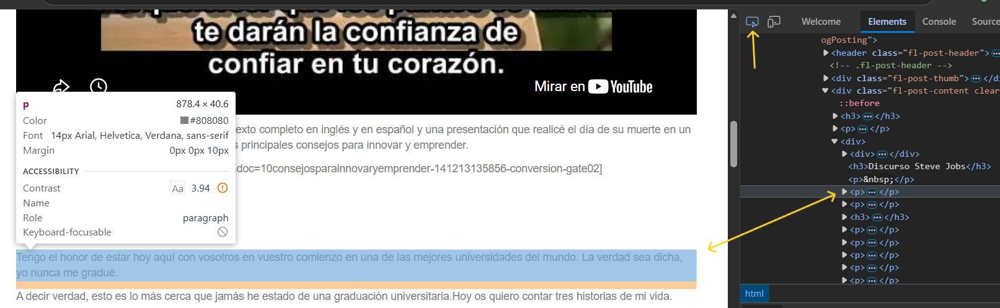

Realizamos el scraping para darle funcionalidad y entendimiento al código. Activamos el cursor como se ve en la imágen y de esta manera buscamos donde comienza realmente el discurso propiamente dicho.

Es en ese lugar que creamos la variable inicio_discurso, volvemos a utilizar el método find, pero esta vez no para buscar las < p > sino para buscar el inicio del discurso y realizar desde ahí el recorte.

Observamos que en la variable "texto_discurso" está además el discurso en inglés, lo que para el análisis no nos interesa.

Nuestro análisis se va a centrar en el discurso en castellano, por lo que cualquier palabra fuera de dicho discurso, por más que sea del discurso pero en otro idioma, puede ser ruido en conceptualizaciones finales.

Procedemos a su recorte de la variable.



In [10]:
# Buscamos si aparece la versión en inglés (por ejemplo, buscando el inicio en inglés)
punto_corte = texto_discurso.find("I am honored to be with you today")
# Creamos la variable punto de corte, estructura igual al código anterior pero esta vez para sacar con la condición la parte en inglés.
# Si encuentra la frase en inglés, recorta el texto para dejar solo lo anterior (el español)
if punto_corte != -1:
    texto_discurso = texto_discurso[:punto_corte] # Realizamos un recorte hasta el punto_corte (inicio del discurso en inglés).
    print("VERSIÓN EN INGLÉS ELIMINADA CON ÉXITO. SÓLO QUEDÓ LA PARTE DEL DISCURSO EN CASTELLANO.")
else:
    print("No se encontró el texto en inglés, o la frase de corte es distinta.")

VERSIÓN EN INGLÉS ELIMINADA CON ÉXITO. SÓLO QUEDÓ LA PARTE DEL DISCURSO EN CASTELLANO.


# En la variable "texto_discurso" ya tenemos el discurso completo en castellano. Realizamos un chequeo, y notamos que ademas de los signos de puntuación correspondientes, al final hay una serie de líneas "- - - - - -" que seguramente luego tengamos que limpiar.

In [11]:
print(texto_discurso)

Tengo el honor de estar hoy aquí con vosotros en vuestro comienzo en una de las mejores universidades del mundo. La verdad sea dicha, yo nunca me gradué.

A decir verdad, esto es lo más cerca que jamás he estado de una graduación universitaria.Hoy os quiero contar tres historias de mi vida. Nada especial. Sólo tres historias.

Dejé la Universidad de Reed tras los seis primeros meses, pero después seguí vagando por allí otros 18 meses, más o menos, antes de dejarlo del todo. Entonces, ¿por qué lo dejé?

Comenzó antes de que yo naciera. Mi madre biológica era una estudiante joven y soltera, y decidió darme en adopción. Ella tenía muy claro que quienes me adoptaran tendrían que ser titulados universitarios, de modo que todo se preparó para que fuese adoptado al nacer por un abogado y su mujer. Solo que cuando yo nací decidieron en el último momento que lo que de verdad querían era una niña.

Así que mis padres, que estaban en lista de espera, recibieron una llamada a medianoche preguntand

# Importamos la herramienta string, que es nativa de Python y además, agregamos los signos de puntuación característicos del castellano: "¡¿".

En el siguiente bloque realizamos la limpieza y luego chequeamos nuestra nueva variable texto_sin_puntuacion.

In [12]:
import string

# Agregamos los signos de apertura en español a la lista estándar
signos_totales = string.punctuation + "¡¿"

# Limpiamos el string completo
texto_sin_puntuacion = ''.join(c for c in texto_discurso if c not in signos_totales)

In [13]:
texto_sin_puntuacion

'Tengo el honor de estar hoy aquí con vosotros en vuestro comienzo en una de las mejores universidades del mundo La verdad sea dicha yo nunca me gradué\n\nA decir verdad esto es lo más cerca que jamás he estado de una graduación universitariaHoy os quiero contar tres historias de mi vida Nada especial Sólo tres historias\n\nDejé la Universidad de Reed tras los seis primeros meses pero después seguí vagando por allí otros 18 meses más o menos antes de dejarlo del todo Entonces por qué lo dejé\n\nComenzó antes de que yo naciera Mi madre biológica era una estudiante joven y soltera y decidió darme en adopción Ella tenía muy claro que quienes me adoptaran tendrían que ser titulados universitarios de modo que todo se preparó para que fuese adoptado al nacer por un abogado y su mujer Solo que cuando yo nací decidieron en el último momento que lo que de verdad querían era una niña\n\nAsí que mis padres que estaban en lista de espera recibieron una llamada a medianoche preguntando“Tenemos un n

## 2- Preprocesamiento

In [14]:
# 1. Instalación de NLTK. La más eficiente dado que es un discurso académico.
!pip install nltk

### 2.1 Muestra las stop words que tenga tu texto.

Importamos la librería y las herramientas correspondientes para trabajar las stopwords del discurso.

In [15]:
import nltk
from nltk.corpus import stopwords # Importa la librería principal de Procesamiento de Lenguaje Natural (NLTK).
from nltk.tokenize import word_tokenize

# Descargar los recursos necesarios de NLTK
nltk.download('punkt') # Descarga los datos necesarios para que el tokenizador reconozca límites de palabras y oraciones.
nltk.download('stopwords') # Descarga el repositorio global de palabras vacías de la librería.
nltk.download('punkt_tab') # Descarga la tabla de mapeo auxiliar obligatoria en las versiones recientes de NLTK para tokenizar.

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

Colocamos las stopwords que tiene esta librería. Para luego trabajar con este vagaje de stopwords sobre el discurso.

In [17]:
# Obtener la lista de stopwords en español
stop_words_es = set(stopwords.words('spanish'))

Mostramos las stopwords del discurso. Vemos que en total son 313.

In [18]:
import nltk
from nltk.corpus import stopwords

texto_minusculas = texto_sin_puntuacion.lower()

# Obtener el listado de stopwords en español y guardarlo en una variable
mis_stopwords = set(stopwords.words('spanish'))

In [19]:
print(len(mis_stopwords))

313


In [21]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
# 1. Separar el texto en tokens usando word_tokenize (más preciso)
palabras_texto = word_tokenize(texto_minusculas)

# 2. Filtrar el texto para conservar únicamente las palabras que sean stopwords
stopwords_en_mi_texto = [palabra for palabra in palabras_texto if palabra in mis_stopwords]

# 3. Mostrar las stopwords reales que aparecen en tu discurso
print("Stopwords encontradas en el discurso:", stopwords_en_mi_texto)
print(f"Total de apariciones de stopwords: {len(stopwords_en_mi_texto)}")

Stopwords encontradas en el discurso: ['tengo', 'el', 'de', 'estar', 'con', 'vosotros', 'en', 'vuestro', 'en', 'una', 'de', 'las', 'del', 'la', 'sea', 'yo', 'me', 'a', 'esto', 'es', 'lo', 'más', 'que', 'he', 'estado', 'de', 'una', 'os', 'de', 'mi', 'nada', 'la', 'de', 'los', 'pero', 'por', 'otros', 'más', 'o', 'antes', 'de', 'del', 'todo', 'por', 'qué', 'lo', 'antes', 'de', 'que', 'yo', 'mi', 'era', 'una', 'y', 'y', 'en', 'ella', 'tenía', 'muy', 'que', 'quienes', 'me', 'tendrían', 'que', 'de', 'que', 'todo', 'se', 'para', 'que', 'fuese', 'al', 'por', 'un', 'y', 'su', 'que', 'cuando', 'yo', 'en', 'el', 'que', 'lo', 'que', 'de', 'era', 'una', 'que', 'mis', 'que', 'estaban', 'en', 'de', 'una', 'a', 'tenemos', 'un', 'no', 'lo', 'por', 'ellos', 'mi', 'se', 'de', 'que', 'mi', 'no', 'tenía', 'y', 'que', 'mi', 'ni', 'había', 'el', 'que', 'se', 'a', 'los', 'de', 'más', 'cuando', 'mis', 'que', 'yo', 'a', 'la', 'y', 'más', 'fui', 'a', 'la', 'pero', 'de', 'una', 'que', 'era', 'como', 'y', 'todos',

**Prompt**

Explicación de cada línea del código anterior. Gracias.

**Respuesta**

Explicación línea por línea.

* import nltk: Importa la librería principal de Procesamiento de Lenguaje Natural (NLTK).

* from nltk.corpus import stopwords: Importa el módulo específico que contiene diccionarios de palabras vacías (stopwords).

* from nltk.tokenize import word_tokenize: Importa la función para separar el texto en palabras individuales (tokens).

* nltk.download('punkt'): Descarga los datos necesarios para que el tokenizador reconozca límites de palabras y oraciones.

* nltk.download('stopwords'): Descarga el repositorio global de palabras vacías de la librería.

* nltk.download('punkt_tab'): Descarga la tabla de mapeo auxiliar obligatoria en las versiones recientes de NLTK para tokenizar.

* stop_words_es = set(stopwords.words('spanish')): Crea un conjunto (set) optimizado con todas las palabras vacías definidas para el idioma español.

### 2.2 Quita las stop-words, caracteres extraños del texto. Utiliza el texto restante para crear una nube de palabras. Usa la biblioteca worldcloud de python.

# Realizamos la limpieza de stopwords, preprocesamiento para la realización de una nube de palabras con contenido de peso.
Si no quitaríamos las stopwords, la nube de palabras no tendría los temas principales del discurso, no se podría realizar una mínima conceptualización, ya que aparecerían muchas (dependiendo la cantidad que queramos) de estas stopwords.

Pasamos todas las palabras a minúscula para registrar a todas y luego las colocamos en la variable "tokens_limpios".

Con un "len" observamos en números la limpieza.

In [22]:
# Tokenizar tu texto e identificar/filtrar las stopwords presentes en el discurso
tokens = word_tokenize(texto_sin_puntuacion.lower())

print(f"\nCantidad de tokens originales: {len(tokens)}")
# Filtrar el texto eliminando las stopwords
tokens_limpios = [palabra for palabra in tokens if palabra not in stop_words_es]
print(f"Cantidad de tokens después de remover stopwords: {len(tokens_limpios)}")


Cantidad de tokens originales: 2221
Cantidad de tokens después de remover stopwords: 1084


In [23]:
dif=len(tokens)-len(tokens_limpios)
print(f"Cantidad de palabras eliminadas: {dif}")

Cantidad de palabras eliminadas: 1137


Chequeamos a modo de análisis y aprendizaje, la diferencia entre los tokens con stopwords (en este caso, cada token = una palabra) y tokens sin y vemos que la diferencia es de 1137.

Por esto mismo, seguramente aparecerían en "primera plana" en nuestra nube de palabras.

# Se crea una lista sin las stopwords. Sin signos, sólo las palabras que contienen, digamos, el contenido conceptual del discurso.

Entonces, vamos a utilizar la variable "tokens_limpios" para realizar la nube de palabras.

In [24]:
print(tokens_limpios)

['honor', 'hoy', 'aquí', 'comienzo', 'mejores', 'universidades', 'mundo', 'verdad', 'dicha', 'nunca', 'gradué', 'decir', 'verdad', 'cerca', 'jamás', 'graduación', 'universitariahoy', 'quiero', 'contar', 'tres', 'historias', 'vida', 'especial', 'sólo', 'tres', 'historias', 'dejé', 'universidad', 'reed', 'tras', 'seis', 'primeros', 'meses', 'después', 'seguí', 'vagando', 'allí', '18', 'meses', 'menos', 'dejarlo', 'entonces', 'dejé', 'comenzó', 'naciera', 'madre', 'biológica', 'estudiante', 'joven', 'soltera', 'decidió', 'darme', 'adopción', 'claro', 'adoptaran', 'ser', 'titulados', 'universitarios', 'modo', 'preparó', 'adoptado', 'nacer', 'abogado', 'mujer', 'solo', 'nací', 'decidieron', 'último', 'momento', 'verdad', 'querían', 'niña', 'así', 'padres', 'lista', 'espera', 'recibieron', 'llamada', 'medianoche', 'preguntando', '“', 'niño', 'esperado', 'queréis', '”', '“', 'supuesto', '”', 'dijeron', 'madre', 'biológica', 'enteró', 'madre', 'titulación', 'universitaria', 'padre', 'siquiera'

In [25]:
# 1. Instalar la librería para la realización de la nube de palabras.
!pip install wordcloud

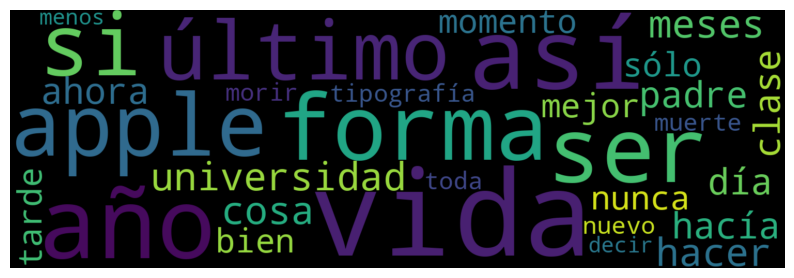

In [36]:
# 2. Importar las librerías necesarias para generar y visualizar la nube
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# 3. Unir los tokens limpios de nuevo en un solo string (WordCloud procesa texto corrido)
texto_para_nube = " ".join(tokens_limpios)

# 4. Crear y configurar la nube de palabras
nube = WordCloud(
    width=1500, # Ancho
    height=500,# Largo
    background_color='black',
    colormap='viridis',
    max_words=30,
    random_state=42
).generate(texto_para_nube)

# 5. Mostrar la nube utilizando Matplotlib
plt.figure(figsize=(10, 10)) # Las pulgadas de la figura.
plt.imshow(nube, interpolation='bilinear')
plt.axis('off') # Ocultar los ejes numéricos
plt.show()

**Prompt**

Consulta, la nube de palabras es aleatoria?

**Respuesta**

* El tamaño de las palabras NO es aleatorio: Está determinado estrictamente por su frecuencia (cuántas veces aparece cada palabra en tu lista de tokens limpios). Las palabras que más se repiten siempre van a aparecer grandes, y las que aparecen menos, pequeñas.

* La ubicación y la rotación SÍ tienen un componente aleatorio: El algoritmo de WordCloud coloca las palabras en el espacio usando posiciones semi-aleatorias para que encajen estéticamente. Si ejecutás el código varias veces seguidas sin modificar nada, vas a notar que la forma, la rotación y el lugar exacto de las palabras cambian en cada ejecución.

Cómo hacer que la nube sea fija (no aleatoria).


Si en tu trabajo práctico querés asegurarte de que la nube siempre se vea exactamente igual cada vez que la ejecutes (algo muy útil para los informes o entregas), podés agregar el parámetro random_state dentro de la configuración de la función WordCloud.

**Prompt** Otros colores hay que sean amables a presentaciones en general? dame 3 que no sean viridis.

**Respuesta**

*cividis:* Diseñado específicamente para ser 100% legible por personas con daltonismo (afectadas por deuteranopia y protanopia). Va de azules oscuros a amarillos y ofrece un contraste excelente.

*plasma:* Una alternativa cálida muy similar a viridis. Transiciona desde púrpuras oscuros hasta rojos intensos y amarillos brillantes, dando un aspecto muy moderno y visualmente llamativo.

*coolwarm:* Ideal para datos divergentes (cuando tienes valores positivos y negativos o dos extremos opuestos). Va de tonos fríos (azul) a cálidos (rojo) pasando por un gris neutro en el centro, lo que facilita una lectura muy intuitiva.

In [37]:
texto_para_nube2 = " ".join(tokens_limpios)
nube2 = WordCloud(
    width=1500,
    height=500,
    background_color='white',
    colormap='plasma',
    max_words=30,
    random_state=42  # <--- Esto fija la aleatoriedad para que siempre salga igual
).generate(texto_para_nube2)

El parámetro "random_state" tiene que utilizar siempre la misma semilla, en este caso, al hacerlo con Gemini, por defecto me va a dar siempre la 42. Será un cálculo de acomodamiento que se mantendrá para que sea siempre igual la nube de palabras.

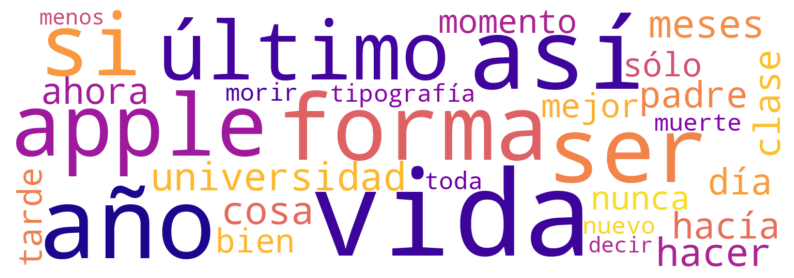

In [38]:
plt.figure(figsize=(10, 10))
plt.imshow(nube2, interpolation='bilinear')
plt.axis('off')
plt.show()

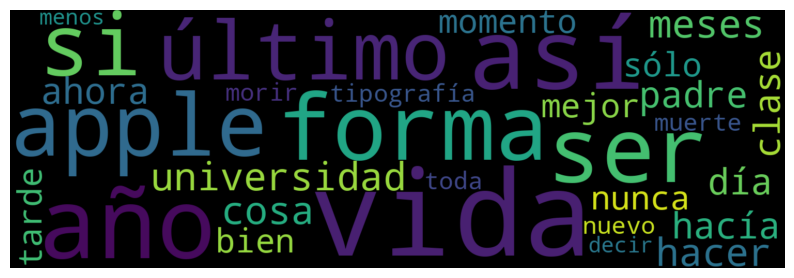

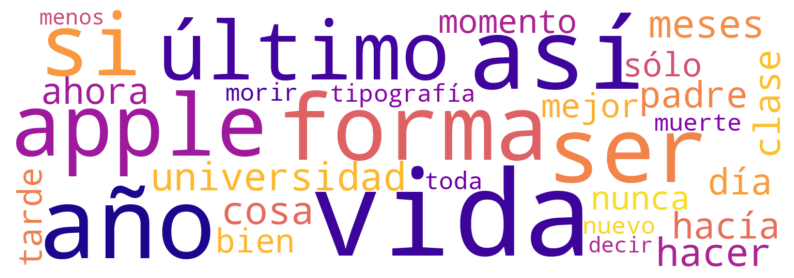

In [39]:
fig1, ax1 = plt.subplots(figsize=(10, 10))
ax1.imshow(nube, interpolation='bilinear')
ax1.axis('off')
plt.show()

# --- Para la variable 'nube2' ---
fig2, ax2 = plt.subplots(figsize=(10, 10))
ax2.imshow(nube2, interpolation='bilinear')
ax2.axis('off')
plt.show()

### 2.3 Usando el texto que conseguiste en el punto 1).



#### 2.3.1 Limpia y preprocesa el texto, descomponelo en oraciones, arma una matriz documento-vocabulario.


**Prompt**

Necesito separar el discurso, variable texto_discurso, en oraciones.

# Realizamos una función para que sea reutilizable.
# La misma la vamos a utilizar para la creación de una variable con stopwords (documentos_con) y otra sin stopwords (documentos_sin) para ver realmente la importancia del preprocesamiento.

In [40]:
import numpy as np
from nltk.tokenize import sent_tokenize, word_tokenize
# sent_tokenize divide el texto en oraciones de forma eficiente.
# word_tokenize lo divide en palabras.

# Lo guardamos en una función para poder reutilizar con otro corpus.
# Es una buena práctica.
def procesar_texto_a_documentos(texto, quitar_stopwords=False, stopwords=None):
    # 1. Descomponer el texto en oraciones
    oraciones = sent_tokenize(texto)

    # 2. Tokenizar y pasar a minúsculas
    if quitar_stopwords and stopwords is not None:
        lista_de_documentos = [
            [palabra for palabra in word_tokenize(oracion.lower()) if palabra not in stopwords]
            for oracion in oraciones
        ]
    else:
        lista_de_documentos = [
            word_tokenize(oracion.lower())
            for oracion in oraciones
        ]

    # 3. Retornar el array de NumPy
    return np.array(lista_de_documentos, dtype=object)

# Creamos dos variables usando el texto que scrapeamos en el punto 1, es decir, "texto_discurso".
# Por un lado, con las stopwords y por el otro sin las stopwords para analizar las diferencias y la importancia del preprocesamiento.
documentos_con= procesar_texto_a_documentos(texto_discurso, quitar_stopwords=False)
documentos_sin= procesar_texto_a_documentos(texto_discurso, quitar_stopwords=True, stopwords=stop_words_es)

Entonces tengo dos variables, una sin stopwords y otra con stopwords, para realizar dos matrices y ver las diferencias correspondientes.

In [41]:
print(documentos_sin)

[list(['honor', 'hoy', 'aquí', 'comienzo', 'mejores', 'universidades', 'mundo', '.'])
 list(['verdad', 'dicha', ',', 'nunca', 'gradué', '.'])
 list(['decir', 'verdad', ',', 'cerca', 'jamás', 'graduación', 'universitaria.hoy', 'quiero', 'contar', 'tres', 'historias', 'vida', '.'])
 list(['especial', '.']) list(['sólo', 'tres', 'historias', '.'])
 list(['dejé', 'universidad', 'reed', 'tras', 'seis', 'primeros', 'meses', ',', 'después', 'seguí', 'vagando', 'allí', '18', 'meses', ',', 'menos', ',', 'dejarlo', '.'])
 list(['entonces', ',', '¿por', 'dejé', '?'])
 list(['comenzó', 'naciera', '.'])
 list(['madre', 'biológica', 'estudiante', 'joven', 'soltera', ',', 'decidió', 'darme', 'adopción', '.'])
 list(['claro', 'adoptaran', 'ser', 'titulados', 'universitarios', ',', 'modo', 'preparó', 'adoptado', 'nacer', 'abogado', 'mujer', '.'])
 list(['solo', 'nací', 'decidieron', 'último', 'momento', 'verdad', 'querían', 'niña', '.'])
 list(['así', 'padres', ',', 'lista', 'espera', ',', 'recibieron'

In [42]:
print(documentos_con)

[list(['tengo', 'el', 'honor', 'de', 'estar', 'hoy', 'aquí', 'con', 'vosotros', 'en', 'vuestro', 'comienzo', 'en', 'una', 'de', 'las', 'mejores', 'universidades', 'del', 'mundo', '.'])
 list(['la', 'verdad', 'sea', 'dicha', ',', 'yo', 'nunca', 'me', 'gradué', '.'])
 list(['a', 'decir', 'verdad', ',', 'esto', 'es', 'lo', 'más', 'cerca', 'que', 'jamás', 'he', 'estado', 'de', 'una', 'graduación', 'universitaria.hoy', 'os', 'quiero', 'contar', 'tres', 'historias', 'de', 'mi', 'vida', '.'])
 list(['nada', 'especial', '.']) list(['sólo', 'tres', 'historias', '.'])
 list(['dejé', 'la', 'universidad', 'de', 'reed', 'tras', 'los', 'seis', 'primeros', 'meses', ',', 'pero', 'después', 'seguí', 'vagando', 'por', 'allí', 'otros', '18', 'meses', ',', 'más', 'o', 'menos', ',', 'antes', 'de', 'dejarlo', 'del', 'todo', '.'])
 list(['entonces', ',', '¿por', 'qué', 'lo', 'dejé', '?'])
 list(['comenzó', 'antes', 'de', 'que', 'yo', 'naciera', '.'])
 list(['mi', 'madre', 'biológica', 'era', 'una', 'estudian

# Vemos una pequeña comparación de los datos que manejamos sin stopwords y con stopwords, para tener una noción visual de la importancia de preprocesar un texto.

In [43]:
print("El primer renglón del documento sin las stopwords.")
print(len(documentos_sin[0]))
print("El primer renglón, pero con las stopwords.")
print(len(documentos_con[0]))

El primer renglón del documento sin las stopwords.
8
El primer renglón, pero con las stopwords.
21


# Ahora realizamos la limpieza de ambas variables, es decir, "documentos_con" y "documentos_sin" para luego tener parte del material para realizar la matriz de términos.

Recordamos, que para este trabajo utilizamos ambas variables, con y sin stopwords, para poder ver la salida y las diferencias tanto de datos como de extracción de conceptos entre un procesamiento y otro.

In [44]:
import string
import numpy as np

def limpiar_puntuacion(documentos):
    signos_totales = string.punctuation + "¡¿"
    return np.array(
        [[palabra for palabra in doc if palabra not in signos_totales] for doc in documentos],
        dtype=object
    )
# Realizamos una funciónq ue nos retorne un array (list para hacer una matriz)
# Aplicando la función a tu variable:
documentos_con_l = limpiar_puntuacion(documentos_con)

# Variable "documentos_con_l" que contiene listas de listas con stopwords sin los signos que puntuación.

In [45]:
print(documentos_con_l)

[list(['tengo', 'el', 'honor', 'de', 'estar', 'hoy', 'aquí', 'con', 'vosotros', 'en', 'vuestro', 'comienzo', 'en', 'una', 'de', 'las', 'mejores', 'universidades', 'del', 'mundo'])
 list(['la', 'verdad', 'sea', 'dicha', 'yo', 'nunca', 'me', 'gradué'])
 list(['a', 'decir', 'verdad', 'esto', 'es', 'lo', 'más', 'cerca', 'que', 'jamás', 'he', 'estado', 'de', 'una', 'graduación', 'universitaria.hoy', 'os', 'quiero', 'contar', 'tres', 'historias', 'de', 'mi', 'vida'])
 list(['nada', 'especial']) list(['sólo', 'tres', 'historias'])
 list(['dejé', 'la', 'universidad', 'de', 'reed', 'tras', 'los', 'seis', 'primeros', 'meses', 'pero', 'después', 'seguí', 'vagando', 'por', 'allí', 'otros', '18', 'meses', 'más', 'o', 'menos', 'antes', 'de', 'dejarlo', 'del', 'todo'])
 list(['entonces', '¿por', 'qué', 'lo', 'dejé'])
 list(['comenzó', 'antes', 'de', 'que', 'yo', 'naciera'])
 list(['mi', 'madre', 'biológica', 'era', 'una', 'estudiante', 'joven', 'y', 'soltera', 'y', 'decidió', 'darme', 'en', 'adopción

In [46]:
import string
import numpy as np

def limpiar_puntuacion(documentos):
    signos_totales = string.punctuation + "¡¿"
    return np.array(
        [[palabra for palabra in doc if palabra not in signos_totales] for doc in documentos],
        dtype=object
    )

# Aplicando la función a tu variable:
documentos_sin_l = limpiar_puntuacion(documentos_sin)

Variable "documentos_sin_l" que contiene listas de listas sin stopwords y sin los signos que puntuación.

In [47]:
print(documentos_sin_l)

[list(['honor', 'hoy', 'aquí', 'comienzo', 'mejores', 'universidades', 'mundo'])
 list(['verdad', 'dicha', 'nunca', 'gradué'])
 list(['decir', 'verdad', 'cerca', 'jamás', 'graduación', 'universitaria.hoy', 'quiero', 'contar', 'tres', 'historias', 'vida'])
 list(['especial']) list(['sólo', 'tres', 'historias'])
 list(['dejé', 'universidad', 'reed', 'tras', 'seis', 'primeros', 'meses', 'después', 'seguí', 'vagando', 'allí', '18', 'meses', 'menos', 'dejarlo'])
 list(['entonces', '¿por', 'dejé']) list(['comenzó', 'naciera'])
 list(['madre', 'biológica', 'estudiante', 'joven', 'soltera', 'decidió', 'darme', 'adopción'])
 list(['claro', 'adoptaran', 'ser', 'titulados', 'universitarios', 'modo', 'preparó', 'adoptado', 'nacer', 'abogado', 'mujer'])
 list(['solo', 'nací', 'decidieron', 'último', 'momento', 'verdad', 'querían', 'niña'])
 list(['así', 'padres', 'lista', 'espera', 'recibieron', 'llamada', 'medianoche', 'preguntando', '“', 'niño', 'esperado', '¿lo', 'queréis', '”', '“', 'supuesto',

**Respuesta**

¿Qué logramos con esto?

* Cumplís con descomponer en oraciones: sent_tokenize toma tu texto largo y lo divide oración por oración (actuando cada oración como un "documento" independiente).

* Calza justo con tu ejemplo: El uso de np.array(..., dtype=object) te deja la variable documentos con la misma estructura visual y técnica que mostraba la imagen que subiste.

# Recordamos lo marcado en los primeros puntos sobre las líneas que aparecen al final del discurso en castellano.

Realizamos un control de ambas listas de listas y notamos que la última lista tiene una serie de líneas que en la web hacen las veces de separadores entre discurso en castellano y en inglés.

Las borramos de ambas variables reutilizando la misma función.

Se puede realizar en el mismo código en caso de detectarlas por supuesto, pero en este caso, dentro del preprocesamiento, también realizamos un análisis visual recorriendo el array y notamos que faltaría esa pequeña limpieza.

In [48]:
import numpy as np

def eliminar_ultima_fila(documentos):
    # Excluye la última lista/oración del array
    return documentos[:-1]

# Aplicándolo a tu variable:
documentos_con_l = eliminar_ultima_fila(documentos_con_l)

In [49]:
import numpy as np

def eliminar_ultima_fila(documentos):
    # Excluye la última lista/oración del array
    return documentos[:-1]

# Aplicándolo a tu variable:
documentos_sin_l = eliminar_ultima_fila(documentos_sin_l)

Realizamos el vector de frecuencias utilizando la herramienta de Scikit Learn CountVectorizer.

# Matriz con las stopwords.

In [50]:
from sklearn.feature_extraction.text import CountVectorizer

def crear_matriz_conteo(documentos):
    # Configuramos el vectorizador para que acepte listas de tokens directamente
    vectorizer = CountVectorizer(tokenizer=lambda x: x, preprocessor=lambda x: x, lowercase=False)

    # Ajustar y transformar la matriz usando tu variable
    matriz_conteo = vectorizer.fit_transform(documentos)

    return vectorizer, matriz_conteo

vectorizador_con, matriz_con_conteo = crear_matriz_conteo(documentos_con_l)

/usr/local/lib/python3.13/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


In [51]:
import pandas as pd

df_conteo_con = pd.DataFrame(
    matriz_con_conteo.toarray(),
    columns=vectorizador_con.get_feature_names_out()
)
print(df_conteo_con)

     10  17  18  2  20  30  33  35  4.000  5  ...  época  éxito  última  \
0     0   0   0  0   0   0   0   0      0  0  ...      0      0       0   
1     0   0   0  0   0   0   0   0      0  0  ...      0      0       0   
2     0   0   0  0   0   0   0   0      0  0  ...      0      0       0   
3     0   0   0  0   0   0   0   0      0  0  ...      0      0       0   
4     0   0   0  0   0   0   0   0      0  0  ...      0      0       0   
..   ..  ..  .. ..  ..  ..  ..  ..    ... ..  ...    ...    ...     ...   
133   0   0   0  0   0   0   0   0      0  0  ...      0      0       0   
134   0   0   0  0   0   0   0   0      0  0  ...      0      0       0   
135   0   0   0  0   0   0   0   0      0  0  ...      0      0       0   
136   0   0   0  0   0   0   0   0      0  0  ...      0      0       0   
137   0   0   0  0   0   0   0   0      0  0  ...      0      0       0   

     último  últimos  única  útil  —  “  ”  
0         0        0      0     0  0  0  0  
1        

# Matriz sin las stopwords.

In [52]:
from sklearn.feature_extraction.text import CountVectorizer

def crear_matriz_conteo(documentos):
    # Configuramos el vectorizador para que acepte listas de tokens directamente
    vectorizer = CountVectorizer(tokenizer=lambda x: x, preprocessor=lambda x: x, lowercase=False)

    # Ajustar y transformar la matriz usando tu variable
    matriz_conteo = vectorizer.fit_transform(documentos)

    return vectorizer, matriz_conteo

vectorizador_sin, matriz_sin_conteo = crear_matriz_conteo(documentos_sin_l)

/usr/local/lib/python3.13/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


In [53]:
import pandas as pd

df_conteo_sin = pd.DataFrame(
    matriz_sin_conteo.toarray(),
    columns=vectorizador_sin.get_feature_names_out()
)
print(df_conteo_sin)

     10  17  18  2  20  30  33  35  4.000  5  ...  época  éxito  última  \
0     0   0   0  0   0   0   0   0      0  0  ...      0      0       0   
1     0   0   0  0   0   0   0   0      0  0  ...      0      0       0   
2     0   0   0  0   0   0   0   0      0  0  ...      0      0       0   
3     0   0   0  0   0   0   0   0      0  0  ...      0      0       0   
4     0   0   0  0   0   0   0   0      0  0  ...      0      0       0   
..   ..  ..  .. ..  ..  ..  ..  ..    ... ..  ...    ...    ...     ...   
133   0   0   0  0   0   0   0   0      0  0  ...      0      0       0   
134   0   0   0  0   0   0   0   0      0  0  ...      0      0       0   
135   0   0   0  0   0   0   0   0      0  0  ...      0      0       0   
136   0   0   0  0   0   0   0   0      0  0  ...      0      0       0   
137   0   0   0  0   0   0   0   0      0  0  ...      0      0       0   

     último  últimos  única  útil  —  “  ”  
0         0        0      0     0  0  0  0  
1        

Para ambas variables, con y sin stopwords, visualizo la totalidad de la matriz para una mejor comprensión.

In [54]:
import pandas as pd

# Mostrar todas las filas y columnas sin truncar
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

display(df_conteo_con)

,10,17,18,2,20,30,33,35,4.000,5,60,70,7:30,a,abogado,abrirse,aconsejó,acontecimientos,actual,actuar,adelante,adiós,adopción,adoptado,adoptaran,adulta,agente,aguja,ahogue,ahora,ahorros,al,algo,alguien,alguna,algunas,alguno,algunos,algún,allí,alocado,alocados,amaba,amantes,amar,amigos,amor,amáis,animación,animado,anterior,antes,apartados,apartamos,aplicación,apple,aprender,aprendí,aquella,aquél,aquí,artísticamente,asegurarte,asombrosa,asuntos,así,atado,atender,atrapar,atrás,autoedición,autoestop,aventureros,averiguarlo,ayudar,ayudarme,año,años,aún,bachillerato,bajo,bastante,bellamente,bellas,bello,biblias,bien,biológica,biopsia,bob,botellas,brand,bueno,buscando,cabeza,cada,caer,cajones,caligrafiadas,caligrafía,cambiado,cambiar,cambio,caminaba,campo,campus,capacitado,capturar,cara,caracteres,carretera,cartulina,casa,casi,catalog,catálogo,cedió,centro,cerca,certeza,chequeo,cielo,ciencia,cierto,cinco,cirugía,cita,claramente,claras,claro,clase,clases,coca,cochera,cola,comencé,comenzar,comenzó,comer,comienzo,como,compartimos,compañía,completamente,compró,con,concepto,conceptos,concreto,conectar,conectarán,confiar,conforméis,conozco,conseguido,conseguir,consideréis,contar,contraportada,contratamos,convencido,convertiría,convirtiendo,copiar,coraje,corazón,cosa,cosas,creación,creado,creamos,crear,creativos,creció,crecía,creo,creé,creía,creó,cuando,cumplido,curar,curiosidad,curso,cámaras,cáncer,células,céntimos,cómo,da,dado,darme,daré,david,de,decidido,decidieron,decidió,decidí,decir,decirle,decirles,decisiones,decía,dejado,dejando,dejara,dejarlo,dejé,dejéis,del,demasiado,demasiados,demás,dentro,desarrollamos,descuidada,desde,deseaba,deseado,deseo,desnudo,despedida,despidieron,después,destino,desvanece,devastador,devolvía,diagnosticaron,diagnóstico,dicha,diez,diferencia,dijeron,dijo,dinero,dio,directiva,diré,disculparme,diseñamos,diseñando,distinta,documentos,dogma,domingos,dormitorio,dormía,dos,dramático,duodeno,durante,décadas,día,días,dólares,e,earth,echado,echar,echaran,edad,ejemplo,el,elegí,ella,ellos,embargo,empleados,emprendedores,empresa,en,enamorado,enamoré,encantaba,encontrado,encontrar,encontrarte,encontré,encontréis,endoscopio,enteró,entonces,entrado,entrar,entre,envase,equipo,era,eran,es,esa,escapado,escribir,ese,esencia,eso,espaciado,espacios,especial,espejo,espera,esperado,esperanza,espero,esposa,esta,estaba,estaban,estado,estar,esto,estoy,estudiante,estudio,estábamos,estás,esté,estómago,etiquetas,evitar,exitoso,expectativas,familia,fascinante,fastidiado,fe,finalmente,firmar,forma,formación,fotografía,fracaso,frente,fue,fuera,fueron,fuese,fui,futuro,fácil,garganta,gastando,gastéis,generación,genial,geniales,gente,giro,google,gracias,graduación,gradual,graduáis,gradué,gran,grande,grandes,ha,haber,haberlo,habiendo,habitaciones,habría,habéis,había,habíamos,habían,hace,hacer,hacerlo,hacia,haciendo,hacía,hagáis,hambriento,hambrientos,hare,has,hasta,hay,haya,hayáis,he,herramienta,herramientas,hicieron,hijos,historias,histórica,hizo,honor,hora,horrible,hoy,hp,hubiera,hubieran,huir,iba,ibas,idea,idealista,ido,idílico,importante,imposible,incluso,incurable,instinto,intel,intelectual,intentar,intenté,interesaban,interesantes,interior,intuición,invento,ir,iréis,iría,jamás,joven,junta,junto,justo,karma,km,krishna,la,lado,ladrillo,lanzado,largo,largometraje,las,laurene,le,lejos,letras,leí,liberó,ligereza,limitado,lista,llamada,llamado,llegar,llegara,llegó,llenar,llevar,llorar,lo,los,luego,mac,macintosh,madre,mano,mantuvo,maravillosa,marcado,marcha,marcó,matriculado,matrícula,mañana,me,mediados,medianoche,medicina,mejor,mejoran,mejores,menlo,menos,mensaje,meses,meterme,metiéndome,mi,microscopio,miedo,mientras,mil,millones,mirado,mirando,mirar,mis,mismo,modo,momento,morir,mostraba,muchas,mucho,muchísimas,muerte,mujer,mundo,muy,máquinas,más,médica,médico,médicos,mí,mínima,múltiples,nacer,naciera,nací,nada,nadie,necesitaba,negó,next,ni,ningún,niña,niño,no,noche,nos,nosotros,notable,notoria,notorio,noyce,nuestra,nuevo,nunca,número,números,o

In [55]:
import pandas as pd

# Mostrar todas las filas y columnas sin truncar
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

display(df_conteo_sin)

,10,17,18,2,20,30,33,35,4.000,5,60,70,7:30,abogado,abrirse,aconsejó,acontecimientos,actual,actuar,adelante,adiós,adopción,adoptado,adoptaran,adulta,agente,aguja,ahogue,ahora,ahorros,alguien,alguna,alguno,algún,allí,alocado,alocados,amaba,amantes,amar,amigos,amor,amáis,animación,animado,anterior,apartados,apartamos,aplicación,apple,aprender,aprendí,aquella,aquél,aquí,artísticamente,asegurarte,asombrosa,asuntos,así,atado,atender,atrapar,atrás,autoedición,autoestop,aventureros,averiguarlo,ayudar,ayudarme,año,años,aún,bachillerato,bajo,bastante,bellamente,bellas,bello,biblias,bien,biológica,biopsia,bob,botellas,brand,bueno,buscando,cabeza,cada,caer,cajones,caligrafiadas,caligrafía,cambiado,cambiar,cambio,caminaba,campo,campus,capacitado,capturar,cara,caracteres,carretera,cartulina,casa,casi,catalog,catálogo,cedió,centro,cerca,certeza,chequeo,cielo,ciencia,cierto,cinco,cirugía,cita,claramente,claras,claro,clase,clases,coca,cochera,cola,comencé,comenzar,comenzó,comer,comienzo,compartimos,compañía,completamente,compró,concepto,conceptos,concreto,conectar,conectarán,confiar,conforméis,conozco,conseguido,conseguir,consideréis,contar,contraportada,contratamos,convencido,convertiría,convirtiendo,copiar,coraje,corazón,cosa,cosas,creación,creado,creamos,crear,creativos,creció,crecía,creo,creé,creía,creó,cumplido,curar,curiosidad,curso,cámaras,cáncer,células,céntimos,cómo,da,dado,darme,daré,david,decidido,decidieron,decidió,decidí,decir,decirle,decirles,decisiones,decía,dejado,dejando,dejara,dejarlo,dejé,dejéis,demasiado,demasiados,demás,dentro,desarrollamos,descuidada,deseaba,deseado,deseo,desnudo,despedida,despidieron,después,destino,desvanece,devastador,devolvía,diagnosticaron,diagnóstico,dicha,diez,diferencia,dijeron,dijo,dinero,dio,directiva,diré,disculparme,diseñamos,diseñando,distinta,documentos,dogma,domingos,dormitorio,dormía,dos,dramático,duodeno,décadas,día,días,dólares,earth,echado,echar,echaran,edad,ejemplo,elegí,embargo,empleados,emprendedores,empresa,enamorado,enamoré,encantaba,encontrado,encontrar,encontrarte,encontré,encontréis,endoscopio,enteró,entonces,entrado,entrar,envase,equipo,escapado,escribir,esencia,espaciado,espacios,especial,espejo,espera,esperado,esperanza,espero,esposa,estudiante,estudio,estómago,etiquetas,evitar,exitoso,expectativas,familia,fascinante,fastidiado,fe,finalmente,firmar,forma,formación,fotografía,fracaso,frente,futuro,fácil,garganta,gastando,gastéis,generación,genial,geniales,gente,giro,google,gracias,graduación,gradual,graduáis,gradué,gran,grande,grandes,haber,haberlo,habitaciones,hace,hacer,hacerlo,hacia,haciendo,hacía,hagáis,hambriento,hambrientos,hare,herramienta,herramientas,hicieron,hijos,historias,histórica,hizo,honor,hora,horrible,hoy,hp,huir,iba,ibas,idea,idealista,ido,idílico,importante,imposible,incluso,incurable,instinto,intel,intelectual,intentar,intenté,interesaban,interesantes,interior,intuición,invento,ir,iréis,iría,jamás,joven,junta,junto,justo,karma,km,krishna,lado,ladrillo,lanzado,largo,largometraje,laurene,lejos,letras,leí,liberó,ligereza,limitado,lista,llamada,llamado,llegar,llegara,llegó,llenar,llevar,llorar,luego,mac,macintosh,madre,mano,mantuvo,maravillosa,marcado,marcha,marcó,matriculado,matrícula,mañana,mediados,medianoche,medicina,mejor,mejoran,mejores,menlo,menos,mensaje,meses,meterme,metiéndome,microscopio,miedo,mientras,mil,millones,mirado,mirando,mirar,mismo,modo,momento,morir,mostraba,muchas,muchísimas,muerte,mujer,mundo,máquinas,médica,médico,médicos,mínima,múltiples,nacer,naciera,nací,nadie,necesitaba,negó,next,ningún,niña,niño,noche,notable,notoria,notorio,noyce,nuevo,nunca,número,números,obligatorias,obtener,ocurrido,ofrecía,operaron,opiniones,ordenador,ordenadores,orgullo,paciente,packard,padre,padres,palabras,pancreático,parecían,park,parte,partes,pasaban,pasado,pasan,paso,pasó,país,pensamiento,pensar,pensé,perder,perdáis,periodos,personal,personales,perspectiva,peso,pincharon,pixar,pocos,podrías,polaroid,poseen,posible,posiblemente,poético,precio,preguntado,p

In [56]:

print(f"Matriz con las stopwords:{len(df_conteo_con.columns)}")
print(f"Matriz sin las stopwords:{len(df_conteo_sin.columns)}")
print(f"Diferencia entre ambas de palabras únicas: {len(df_conteo_con.columns)-len(df_conteo_sin.columns)}")

Matriz con las stopwords:818
Matriz sin las stopwords:694
Diferencia entre ambas de palabras únicas: 124


# Realizamos una comparación, utilizando la misma cantidad de palabras que lo hicimos en la nube de palabras, para visualizar la cantidad de repeticiones de palabras con ambas variables.
# Recordemos que para la nube usamos la variable "texto_para_nube" que fue la adaptación de la variable "tokens_limpios", es decir, los tokens (palabras) sin stopwords.
# Así, podemos tener otra visualización de la importancia de un preprocesamiento para poder sacar conclusiones de diferente índole de un documento analizado.
# En nuestro caso, una correcta limpieza nos permite realizar una mejor conceptualización del discurso, para poder procesar de una manera más eficaz el sentimiento del mensaje.  

# Cantidad de veces que aparecen las palabras, con las stopwords incluidas.

In [57]:
def mostrar_palabras_frecuentes_df(df_conteo, top_n=30):
    # 1. Sumamos las frecuencias de cada columna (palabra) y ordenamos de mayor a menor
    suma_frecuencias = df_conteo.sum(axis=0).sort_values(ascending=False)

    # 2. Mostramos el ranking de las N palabras más usadas
    for palabra, frecuencia in suma_frecuencias.head(top_n).items():
        print(f"{palabra}: {frecuencia} veces")

mostrar_palabras_frecuentes_df(df_conteo_con, top_n=30)

de: 105 veces
que: 99 veces
y: 65 veces
la: 53 veces
en: 51 veces
el: 47 veces
a: 45 veces
lo: 36 veces
no: 32 veces
los: 31 veces
me: 30 veces
una: 23 veces
más: 21 veces
mi: 21 veces
un: 21 veces
las: 19 veces
para: 18 veces
vida: 18 veces
es: 18 veces
con: 16 veces
era: 15 veces
por: 15 veces
del: 14 veces
pero: 14 veces
cuando: 13 veces
años: 12 veces
así: 12 veces
había: 11 veces
se: 11 veces
ser: 10 veces


# Cantidad de veces, pero sin las stopwords incluidas.

In [58]:
def mostrar_palabras_frecuentes_df(df_conteo, top_n=30):
    # 1. Sumamos las frecuencias de cada columna (palabra) y ordenamos de mayor a menor
    suma_frecuencias = df_conteo.sum(axis=0).sort_values(ascending=False)

    # 2. Mostramos el ranking de las N palabras más usadas
    for palabra, frecuencia in suma_frecuencias.head(top_n).items():
        print(f"{palabra}: {frecuencia} veces")

mostrar_palabras_frecuentes_df(df_conteo_sin, top_n=30)

vida: 18 veces
así: 12 veces
años: 12 veces
forma: 10 veces
ser: 10 veces
si: 9 veces
apple: 9 veces
meses: 7 veces
hacer: 7 veces
universidad: 7 veces
”: 6 veces
ahora: 6 veces
último: 6 veces
cosas: 6 veces
hacía: 6 veces
“: 6 veces
padres: 5 veces
tarde: 5 veces
sólo: 5 veces
momento: 5 veces
nuevo: 5 veces
morir: 5 veces
nunca: 5 veces
bien: 5 veces
día: 5 veces
muerte: 5 veces
mejor: 5 veces
diez: 4 veces
decir: 4 veces
año: 4 veces


# Notamos que para la primera variable aparecen en el análisis sólo stopwords (lógico).
# Ya con la limpieza de éstas observamos que podemos realizar una representación conceptual y un análisis más profundo del discurso, ya que aparecen palabras tales como: vida, años, forma, apple, hacer, universidad, morir, etc.

# Que pasaría si habríamos usado la técnica One Hot Encoding?

Si habríamos hecho una matriz con la técnica One Hot Encoding, no nos habría dado una matriz con frecuencias de cada palabra del vocabulario en cada oración (aparecer 0 veces, o 1 vez, o 2 veces, etc.) sino que habríamos obtenido una matriz con ceros y unos y el peso de cada palabra no existiría para realizar una análisis conceptual.


#### 2.3.2 Determina la longitud de tu vocabulario.

Con un len y por columna (que es cada palabra del discurso), realizamos un conteo de todo el vocabulario: Notamos que hay 818 palabras sin la limpieza de las stopwords y 694 con la limpieza.

Seguimos, ahora con la longitud del vocabulario, es decir, de las palabras únicas, la diferenciación en el manejo de datos con un preprocesamiento y el otro.

In [59]:
print(len(df_conteo_con.columns))

818


In [60]:
print(len(df_conteo_sin.columns))

694



#### 2.3.3. Aplica TF-IDF a tu matriz documento-vocabulario

In [61]:
from sklearn.feature_extraction.text import TfidfVectorizer

def crear_matriz_tfidf(documentos):
    # Configuramos el vectorizador TF-IDF para aceptar listas de tokens directamente
    tfidf_vectorizer = TfidfVectorizer(
        tokenizer=lambda x: x,
        preprocessor=lambda x: x,
        lowercase=False
    )

    # Ajustar y transformar el corpus
    tfidf_matrix = tfidf_vectorizer.fit_transform(documentos)

    return tfidf_vectorizer, tfidf_matrix

vectorizador_tfidf, matriz_tfidf = crear_matriz_tfidf(documentos_con_l)

/usr/local/lib/python3.13/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


In [62]:
import pandas as pd

df_tfidf_con = pd.DataFrame(
    matriz_tfidf.toarray(),
    columns=vectorizador_tfidf.get_feature_names_out()
)

print(df_tfidf_con)

           10        17        18         2        20        30        33  \
0    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
1    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
2    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
3    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
4    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
5    0.000000  0.000000  0.233946  0.000000  0.000000  0.000000  0.000000   
6    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
7    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
8    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
9    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
10   0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
11   0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   

In [63]:
from sklearn.feature_extraction.text import TfidfVectorizer

def crear_matriz_tfidf(documentos):
    # Configuramos el vectorizador TF-IDF para aceptar listas de tokens directamente
    tfidf_vectorizer = TfidfVectorizer(
        tokenizer=lambda x: x,
        preprocessor=lambda x: x,
        lowercase=False
    )

    # Ajustar y transformar el corpus
    tfidf_matrix = tfidf_vectorizer.fit_transform(documentos)

    return tfidf_vectorizer, tfidf_matrix

vectorizador_tfidf, matriz_tfidf = crear_matriz_tfidf(documentos_sin_l)

/usr/local/lib/python3.13/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


In [64]:
import pandas as pd

df_tfidf_sin = pd.DataFrame(
    matriz_tfidf.toarray(),
    columns=vectorizador_tfidf.get_feature_names_out()
)

print(df_tfidf_sin)

           10        17        18         2        20        30        33  \
0    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
1    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
2    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
3    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
4    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
5    0.000000  0.000000  0.275716  0.000000  0.000000  0.000000  0.000000   
6    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
7    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
8    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
9    0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
10   0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
11   0.000000  0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   

Pequeño análisis de una palabra. En este caso la palabra "confiar".
Probamos buscar por columnas con la misma variable de búsqueda. Y notamos que ya se movió la columna que corresponde a "confiar" luego de sacar la limpieza.

In [65]:
# 1. Encontrar la posición numérica de la columna "confiar"
col_idx = df_tfidf_con.columns.get_loc("confiar")

# 2. Seleccionar la fila 19 y las 2 columnas anteriores, "confiar" y las 2 posteriores
resultado_con = df_tfidf_con.iloc[[19], col_idx - 2 : col_idx + 3]
resultado_sin = df_tfidf_sin.iloc[[19], col_idx - 2 : col_idx + 3]

# 3. Mostrar los resultados
print("--- DataFrame con stop words ---")
display(resultado_con)

print("\n--- DataFrame sin stop words ---")
display(resultado_sin)

--- DataFrame con stop words ---


,conectar,conectarán,confiar,conforméis,conozco
19,0.0,0.0,0.354277,0.0,0.0



--- DataFrame sin stop words ---


,contar,contraportada,contratamos,convencido,convertiría
19,0.0,0.0,0.0,0.0,0.0


Entonces la búsqueda, ya es con variables puntuales, por un lado con stopwords y por el otro sin.

Y ahí notamos que aparece y tienen pesos diferentes.

In [66]:
# 1. Encontrar la posición de "confiar" en CADA DataFrame por separado
col_idx_con = df_tfidf_con.columns.get_loc("confiar")
col_idx_sin = df_tfidf_sin.columns.get_loc("confiar")

# 2. Seleccionar la fila 19 con las 2 columnas anteriores y 2 posteriores para cada uno
resultado_con = df_tfidf_con.iloc[[19], col_idx_con - 2 : col_idx_con + 3]
resultado_sin = df_tfidf_sin.iloc[[19], col_idx_sin - 2 : col_idx_sin + 3]

# 3. Mostrar los resultados
print("--- DataFrame con stop words ---")
display(resultado_con)

print("\n--- DataFrame sin stop words ---")
display(resultado_sin)

--- DataFrame con stop words ---


,conectar,conectarán,confiar,conforméis,conozco
19,0.0,0.0,0.354277,0.0,0.0



--- DataFrame sin stop words ---


,conectar,conectarán,confiar,conforméis,conozco
19,0.0,0.0,0.392971,0.0,0.0


Tenemos nuestras matrices TF-IDF. Como dijimos, por un lado con las stopwords y por el otro sin.
Las columnas corresponden a las palabras únicas que aparecen en todo el corpus, en todo el discurso. Y las filas corresponden a la cantidad de oraciones. El número obtenido es la importancia de esa palabra en dicha oración, por lo que, como vemos, algunas palabras varian sus datos respecto a tener o no las stopwords.

# Notamos que la cantidad de oraciones son 137. Y usando las posibilidades de manipular el data frame que nos ofrece Pandas, buscamos por ejemplo, la palabra "confiar".

# Vemos que en la matriz con las stopwords aparece en una columna diferente por un lado y por el otro, que, por ejemplo, su valor en la oración 19 es de 0.35 y sin las stopwords su valor es de 0.39.
# Con lo cual, podemos ver en datos duros la valoración de esa palabra ("confiar") en dicha oración.
#Y si uno la conceptualiza después de leer el texto, se puede notar que la mayor valoración en un texto pre procesado y usando TF-IDF nos dá en datos una conceptualización que se acerca mucho más a una análisis de compresión del mensaje a nivel humano.

**Prompt** Perfecto, y al final de toda esa columna de cada palabra hay un valor puntual para cada palabra para ver su peso en todo el corpus?

**Respuesta** No de forma automática como un único valor, ya que cada columna tiene tantos valores como filas (documentos/oraciones) existan. Es decir, para una misma palabra, tendrás un peso TF-IDF distinto en cada documento donde aparezca.
Igual que hiciste con la matriz de conteo, puedes sumar o promediar los valores de toda la columna (por ejemplo, usando .sum(axis=0) en la matriz TF-IDF). Eso te dará un puntaje global que resume el peso total de esa palabra en el conjunto entero del corpus.

Explica el formato de tu matriz resultante: documentos, vocabulario, tamaño. Brinda tus conclusiones.

# Mostramos los diferentes análisis provenientes de las diferentes matrices, procesamientos y manejos de datos:

1 - Orden de peso de importancia de las palabras con las stopwords utilizando matriz TF-IDF.

2 - Peso de importancia sin las stopwords de la matriz TF-IDF.

3 - Orden según la frecuencia utilizando la matriz conteo de frecuencia (CounterVectorize).

4 - Nube de palabras sacada de la variable de tokens sin stopwords.

Todas tienen la misma cantidad de palabras elegidas.

# Matriz TF-IDF con stopwords.

In [67]:
suma_tfidf_con_stopwords = df_tfidf_con.sum(axis=0).sort_values(ascending=False)
# con el método sum sumamos entonces los valores de cada columna (feature en teste caso, es una palabra)
# tendremos el pedo de cada palabra en el corpus.

# 2. Mostramos las 10 palabras con mayor peso acumulado en el corpus
print(suma_tfidf_con_stopwords.head(10))

que    9.882933
de     9.789574
y      7.315985
la     6.527805
en     6.138759
el     5.657460
lo     5.656844
a      5.624647
no     5.533271
me     4.864643
dtype: float64


# Matriz TF-IDF sin stopwords.

In [68]:
suma_tfidf_sin_stopwords = df_tfidf_sin.sum(axis=0).sort_values(ascending=False)
# ascending es falso para que sea en orden de mayor a menor respecto a la importancia.
# 2. Mostramos las 10 palabras con mayor peso acumulado en el corpus
print(suma_tfidf_sin_stopwords.head(10))

vida          4.179801
así           3.352471
años          2.550802
forma         2.548414
ser           2.419902
sigue         2.289989
seguid        2.194370
apple         2.159138
meses         2.011655
conforméis    2.000000
dtype: float64


In [69]:
mostrar_palabras_frecuentes_df(df_conteo_sin, top_n=10)

vida: 18 veces
así: 12 veces
años: 12 veces
forma: 10 veces
ser: 10 veces
si: 9 veces
apple: 9 veces
meses: 7 veces
hacer: 7 veces
universidad: 7 veces


**Prompt** Necesitaría poner estos tres códigos en uno sólo, es decir, que se muestren las tres salidas en una celda y que estén en forma paralela para una mejor visualización de las similitudes y diferencias. Gracias.

**Respuesta** La respuesta fue un código con utilización de HTML aprovechando su flexibilidad.

In [70]:
from IPython.display import display, HTML
import pandas as pd

# 1. Preparamos los datos como DataFrames individuales (top 10 de cada uno)
df1 = suma_tfidf_con_stopwords.head(10).to_frame(name="TF-IDF (con Stopwords)")
df2 = suma_tfidf_sin_stopwords.head(10).to_frame(name="TF-IDF (sin Stopwords)")

# Para la frecuencia absoluta, creamos un DataFrame rápido con el resultado
freq_data = dict(list(df_conteo_sin.sum(axis=0).sort_values(ascending=False).head(10).items()))
df3 = pd.DataFrame(list(freq_data.items()), columns=['Palabra', 'Frecuencia']).set_index('Palabra')
df3.columns = ["Frec. Absoluta"]
df3.columns = ["Frec. Absoluta"]
df3.index.name = None

# 2. Convertimos los DataFrames a código HTML
html1 = df1._repr_html_()
html2 = df2._repr_html_()
html3 = df3._repr_html_()

# 3. Diseñamos el contenedor con estilo Flexbox para ponerlos lado a lado
estilo_flex = f"""
<div style="display: flex; flex-direction: row; gap: 20px; justify-content: flex-start; align-items: flex-start;">
    <div>{html1}</div>
    <div>{html2}</div>
    <div>{html3}</div>
</div>
"""

# 4. Mostramos el resultado integrado en la celda
display(HTML(estilo_flex))

,TF-IDF (con Stopwords)
que,9.882933
de,9.789574
y,7.315985
la,6.527805
en,6.138759
el,5.657460
lo,5.656844
a,5.624647
no,5.533271
me,4.864643


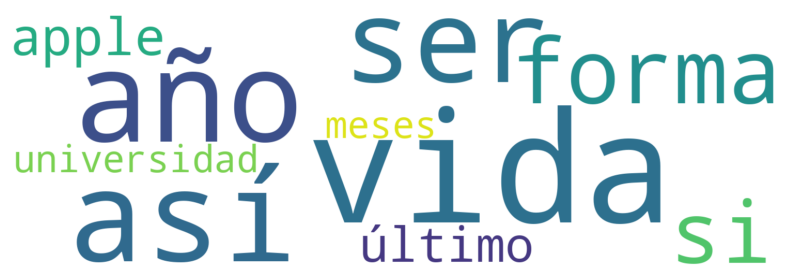

In [71]:
# @title
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# 3. Unir los tokens limpios de nuevo en un solo string (WordCloud procesa texto corrido)
texto_para_nube = " ".join(tokens_limpios)

# 4. Crear y configurar la nube de palabras
nube = WordCloud(
    width=1500, # Ancho
    height=500,# Largo
    background_color='white',
    colormap='viridis',
    max_words=10 # Cantidad de palabras de la WorlCloud.
).generate(texto_para_nube)

# 5. Mostrar la nube utilizando Matplotlib
plt.figure(figsize=(10, 10)) # Las pulgadas de la figura.
plt.imshow(nube, interpolation='bilinear')
plt.axis('off') # Ocultar los ejes numéricos
plt.show()

# Conclusiones
Para el análisis del discurso de Steve Jobs, o al menos un recorte del análisis total a los efectos prácticos, finalmente decidí incrustar en un código HTML para la mejor visual, el orden de importancia o peso de la palabra teniendo en cuenta TF-IDF con las stopwords, sin las stopwords y de la matriz de Conteo de frecuencias sin las stopwords. Abajo también usamos la nube de palabras procesada anteriormente, para sumar a la comparación.

Con la utilización de la matriz TF-IDF con stopwords, podemos apreciar que nos va a dar como importantes sobre todo las stopwords, haciendo que un análisis de conceptos de importancia se pierda.

La sumatoria de importancia usando el TF-IDF sin stopwords, podemos apreciar que el peso de las palabras principales cambia radicalmente. Palabras como vida, así, años, forma, ser, apple, conforméis aparecen con un gran peso en el discurso.

Si pasamos a la tabla de Frec. Absoluta, devenida de la herramienta ConteoVectorizer sin stopwords, notamos que hay palabras que se repiten respecto a la tabla TF-IDF sin stopwords: vida, años, forma, ser. Aparece apple también pero en otro lugar y otras palabras que en TF-IDF no.

Por otro lado, la nube de palabras sin stopwords (elaborada de un vector de tokens sin stopwords) vemos que es muy similar a la importancia que da la Frec. Absoluta.

Teniendo en cuenta este proceso de aprendizaje y de qué manera se realiza cada matriz, podemos llegar a notar los datos que tenemos de TF-IDF sin stopwords me dan un peso de las palabras con contenido de una manera más fina para el análsis.
Es una función que permite penalizar las palabras más comunes según la aparición en los documentos u oraciones en este caso (que en principio tendrían menos contenido) y destaca dado el logaritmo a las que aparecen en cantidad pero no en la mayor cantidad de oraciones, conceptos que en principio tendrían mayor exclusividad y mayor peso conceptual.

Entonces palabras tales como: vida, así, años, forma, ser, sigue, seguid, apple, meses, conforméis... nos darían una conceptulización de mayor contenido respecto al discurso. Pero esta conceptualización no podría ser completa, si el ojo humano no lee y analiza sin estas herramientas una y otra vez dicho discurso. Al hacer eso y contrastar, tanto el análisis humano y conceptual con el análisis de los algoritmos y matricial, podemos llegar a la conclusión de la importancia del análisis TF-IDF ya que palabras que nos dá son realmente de una importancia conceptual mayor (y esto es análisis puramente humano) ya que:
* vida: Le da mucha importancia en el discurso a lo que uno hace con su vida, al contenido de la misma.
* así: Muestra en diferentes momento como realizó su obra, o como conector de cómo tomó tal o cual decisión.
* años y meses: Palabras que marcan la importancia de sus etapas, las diversas decisión y aprendizajes de vida. Relacionado con momentos de determinados años y meses clave para él. Muestra la importancia de algunos momentos durante su juventud para empatizar con su público.
* forma: La forma de hacer determinadas cosas, formas de gestionar momentos de su vida.
* ser: Destaca el ser en tanto buscar ser uno mismo, no traicionarse, buscar lo que uno ama.
* sigue y seguid: Utiliza estas palabras para enfatizar que si uno tiene un objetivo no hay que detenerse.
* apple: Menciona la importancia de su empresa en su vida.
* conforméis: Palabra que toma valor en un contexto de negación de la misma, utilizando no u otras construcciones. La importancia de no conformarse.

Estos análisis es importante que sean realizados con la IA y diversos algoritmos, pero no tendrían conceptualización si no ponemos la parte humana en lograr comprender lo que nos devuelve. La lectura humana, la lectura de mi parte para realizar un cierre y un entendimiento de este proceso fue clave, ya que me permite (usando mi subjetividad también) hacer un cruce con los datos duros de la matriz y fijar el mensaje y conocimientos tantos hard como también los blandos, los conceptuales, las enseñanzas de una vida completa de proyectos fantásticos.


